In [1]:
from PIL import Image
import numpy as np
#comment

IMAGE_ORIGINALE = "image_originale.png" 
IMAGE_ENCODEE = "image_encodee_R_simple.png"
MESSAGE_SECRET = "Mon message secret pour le TP LSB en Rouge!"

In [2]:
# utilitaire 

def text_to_binary(text):
    """Convertit texte en binaire (ex: 'A' -> '01000001')."""
    binary_string = ""
    for char in text:
        binary_string += format(ord(char), '08b')
    return binary_string

In [3]:

# ENCODAGE

def encode_message_simple(image_path, message, output_path):
    """Cache le message dans le LSB du canal R (1 bit/pixel)."""
    
    img = Image.open(image_path).convert("RGB")
    
    # Ajout du terminateur '00000000'
    binary_message = text_to_binary(message + '\x00')
    msg_len = len(binary_message)
    bit_index = 0
    
    for y in range(img.height):
        for x in range(img.width):
            if bit_index >= msg_len:
                img.save(output_path, "PNG")
                return 
            
            r, g, b = img.getpixel((x, y))
            bit_to_encode = int(binary_message[bit_index])
            
            # Modification LSB : (r & ~1) met LSB à 0. | bit_to_encode ajoute le nouveau bit.
            r = (r & ~1) | bit_to_encode
            
            bit_index += 1
            
            img.putpixel((x, y), (r, g, b))
            
    img.save(output_path, "PNG")


In [4]:



# 1. ENCODAGE
print(f"1. Encodage en cours de: '{MESSAGE_SECRET}'")
encode_message_simple(IMAGE_ORIGINALE, MESSAGE_SECRET, IMAGE_ENCODEE)
print(f"   Image encodée générée: {IMAGE_ENCODEE}")


1. Encodage en cours de: 'Mon message secret pour le TP LSB en Rouge!'
   Image encodée générée: image_encodee_R_simple.png


--- RÉSULTATS D'ANALYSE ---
Nombre de bits modifiés : 193
Mean Squared Error: 0.0000


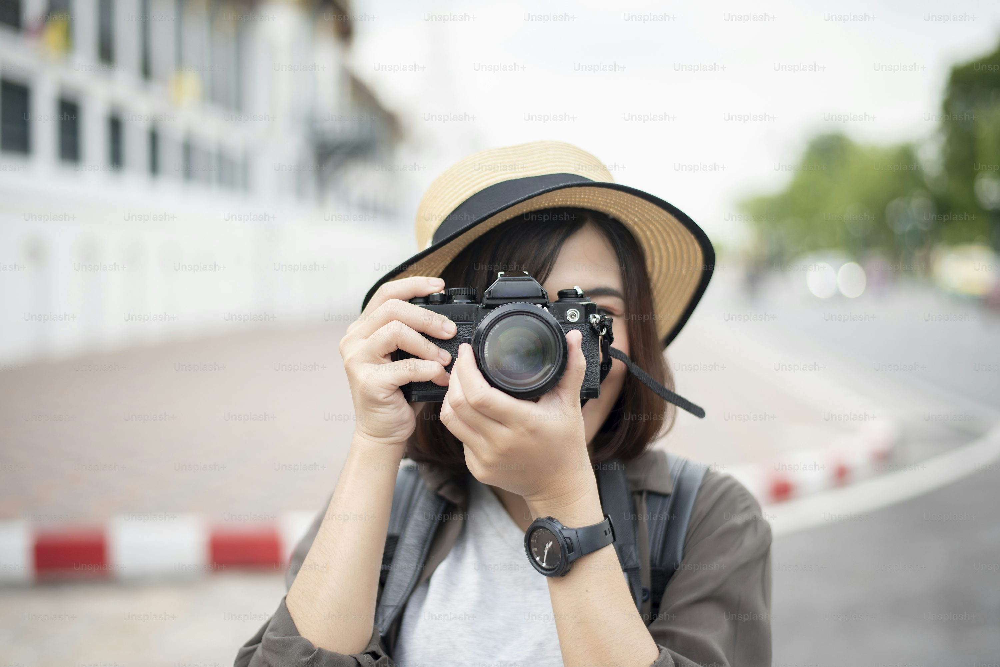

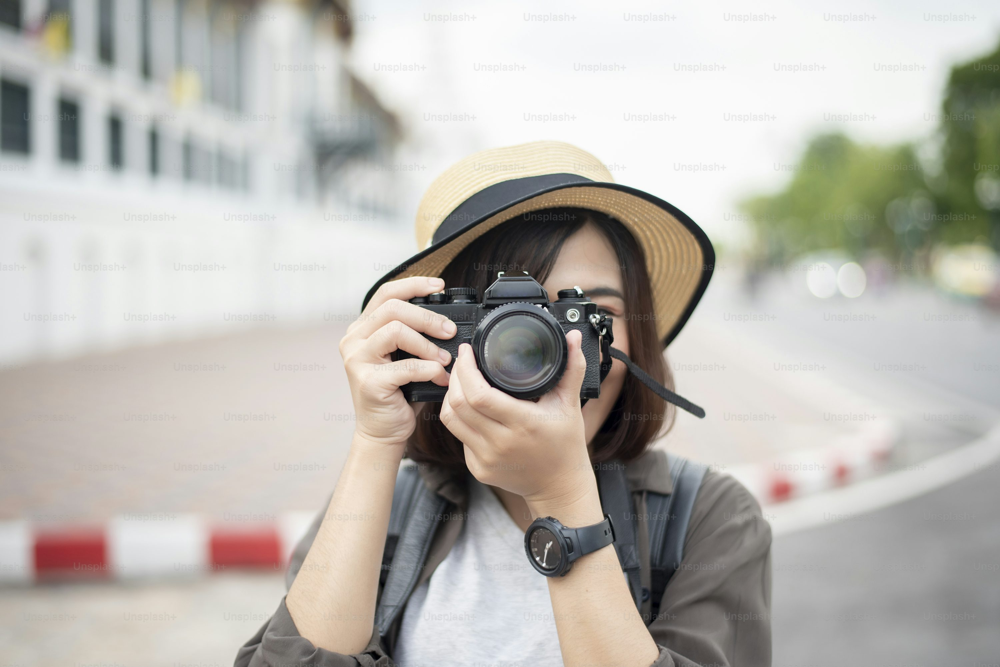

In [5]:
# --- FONCTION D'ANALYSE ---

def analyze_simple(original_path, encoded_path):
    """Calcule le MSE et le nombre de bits modifiés (canal R uniquement)."""
    
    img_orig = Image.open(original_path).convert("RGB")
    img_enc = Image.open(encoded_path).convert("RGB")

    arr_orig = np.array(img_orig, dtype=np.uint8)#transformation en tableau numpy
    arr_enc = np.array(img_enc, dtype=np.uint8)
    
    # Isoler les canaux Rouges (index 0)
    r_orig = arr_orig[:, :, 0]
    r_enc = arr_enc[:, :, 0]

    # Calcul du nombre de bits modifiés (comparaison des LSBs de R)
    lsb_orig = r_orig & 1
    lsb_enc = r_enc & 1
    nb_bits_modifies = (lsb_orig != lsb_enc).sum()

    # Calcul de la MSE globale (sur R, G, B)
    mse = np.mean((arr_orig.astype(np.float64) - arr_enc.astype(np.float64)) ** 2)

    return nb_bits_modifies, mse

# --- AFFICHAGE ET EXÉCUTION ---

nb_bits, mse_value = analyze_simple(IMAGE_ORIGINALE, IMAGE_ENCODEE)

print("--- RÉSULTATS D'ANALYSE ---")
print(f"Nombre de bits modifiés : {nb_bits}")
print(f"Mean Squared Error: {mse_value:.4f}")

# Affichage des images pour la comparaison visuelle
display(Image.open(IMAGE_ORIGINALE), Image.open(IMAGE_ENCODEE))
print("")